In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

import cv2
import math
import imutils
import numpy as np
import pandas as pd
import tensorflow as tf
from utils import formatImagesForPCA
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet import preprocess_input

from skimage import img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse

In [2]:
def get_statistical_measures(gt=None,
                             det=None,
                             r=5):
    """!@brief
    """
    # Assertions
    assert gt is not None
    assert det is not None

    # Prepare data
    gt['count'] = 'FN'
    det['count'] = 'FP'

    # Loop for all frames
    # ===================
    for f in gt.frame.unique():

        # Compute measures for each frame individualy
        gt_frame = gt[gt['frame'] == f]

        # Find matchings and accumulate corresponding values
        for i_gt, r_gt in gt_frame.iterrows():
            # Get sub-set of detected points
            det_fp = det[(det['frame'] == f) & (det['count'] == 'FP')]
            if det_fp.empty:
                break

            min_dist = r+1

            # Iterate in det array
            for i_det, r_det in det_fp.iterrows():
                dist = np.sqrt((r_gt['x']-r_det['x'])**2 + (r_gt['y']-r_det['y'])**2)

                if dist <= r and dist < min_dist:
                    min_dist = dist
                    min_idx = i_det

            # Found a matching point
            if min_dist <= r:
                gt['count'].at[i_gt] = 'TP'
                det['count'].at[min_idx] = 'TP'

    # Get countings
    try:
        TP = gt.groupby('count').size().at['TP']
    except:
        TP = 0

    try:
        FN = gt.groupby('count').size().at['FN']
    except:
        FN = 0

    try:
        FP = det.groupby('count').size().at['FP']
    except:
        FP = 0

    # Compute final measures
    P = TP / (TP+FP)
    R = TP / (TP+FN)

    if P > 0 and R > 0:
        F1 = (2*P*R) / (P+R)
    else:
        F1 = 0

    return P, R, F1, gt, det

In [3]:
def get_measures_map(gt, det, r):
    """!@brief
    
    @note One ground truth point can be associated to 
    more than one predicted point.
    """
    # Assertions
    gt = gt[gt['frame']==1]
    det = det[det['frame']==1]
    
    # Prepare data
    gt['count'] = 'FN'
    det['count'] = 'FP'
    
    # Find matchings and accumulate corresponding values
    for i_det, r_det in det.iterrows():
        # Iterate in ground truth array
        for i_gt, r_gt in gt.iterrows():
            
            dist = np.sqrt( (r_gt['x']-r_det['x'])**2 + (r_gt['y']-r_det['y'])**2 )
            
            if dist <= r:
                gt['count'].at[i_gt] = 'TP'
                det['count'].at[i_det] = 'TP'
                break

    # Get countings
    # @note
    #     TP is calculated using det array because
    # it is possible to have more than one point 
    # associated to a ground truth centroid.
    try:
        TP = gt.groupby('count').size().at['TP']
    except:
        TP = 0
    
    try:
        FN = gt.groupby('count').size().at['FN']
    except:
        FN = 0
    
    try:
        FP = det.groupby('count').size().at['FP']
    except:
        FP = 0
    
    # Compute final measures
    P = TP / (TP+FP)
    R = TP / (TP+FN)
    
    if P>0 and R>0:
        F1 = (2*P*R) / (P+R)
    else:
        F1 = 0
    
    return P, R, F1

In [4]:
def resize_image(img, min_side=1000, max_side=1400):
    """!@brief
    Resize an image such that the size is constrained to min_side and max_side.

    @param min_side: The image's min side will be equal to min_side after resizing.
    @param max_side: If after resizing the image's max side is above max_side,
                     resize until the max side is equal to max_side.

    @return
        A resized image.
    """
    # Compute scale to resize the image
    # ---------------------------------
    (rows, cols, _) = img.shape

    smallest_side = min(rows, cols)

    # rescale the image so the smallest side is min_side
    scale = min_side / smallest_side

    # check if the largest side is now greater than max_side, which can happen
    # when images have a large aspect ratio
    largest_side = max(rows, cols)
    if largest_side * scale > max_side:
        scale = max_side / largest_side

    # Resize the image with the computed scale
    # ----------------------------------------
    img = cv2.resize(img, None, fx=scale, fy=scale)

    return img

### Models and layer names

- __Xception:__ block4_sepconv1_act (free shape)
- __VGG16:__ block3_conv1 (free shape)
- __VGG19:__ block3_conv1 (free shape)
- __ResNet50:__ conv2_block3_out (free shape)
- __ResNet101:__ conv2_block3_out (free shape)
- __ResNet152:__ conv2_block3_out (free shape)
- __ResNet50V2:__ conv2_block3_out (free shape)
- __ResNet101V2:__ conv2_block3_out (free shape)
- __ResNet152V2:__ conv2_block3_out (free shape)
- __InceptionV3:__ activation_22 (free shape)
- __InceptionResNetV2:__ block35_1_ac (free shape)
- __DenseNet121:__ pool2_relu (free shape)
- __DenseNet169:__ pool2_relu (free shape)
- __DenseNet201:__ pool2_relu (free shape)
- __NASNetLarge:__ activation (331, 331, 3)

In [5]:
model = tf.keras.applications.VGG19(input_tensor=None, #tf.keras.Input(shape=(1000, 1374, 3)),
                                       weights='imagenet',
                                       include_top=False)
model.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

In [6]:
img_path = 'data/brain_2__1.jpg'
img = cv2.imread(img_path)

original_size = (img.shape[1], img.shape[0])
x = resize_image(img, 1000, 1400)
# x = cv2.resize(img, (331,331), cv2.INTER_LINEAR)
x = image.img_to_array(x)
x = np.expand_dims(x, axis=0)
# x = preprocess_input(x)

print("Original shape:", img.shape)
print("Model input shape:", x.shape)

Original shape: (244, 360, 3)
Model input shape: (1, 949, 1400, 3)


Original shape: (244, 360, 3)
Model output shape: (237, 350)
Resized output shape: (244, 360, 256)
Number of output images: 256


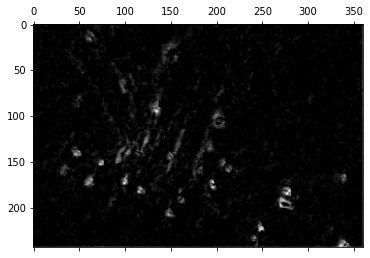

In [7]:
layer_name = ['block3_conv1']
intermediate_layer_model = tf.keras.Model(inputs=model.input, outputs=model.get_layer(layer_name[0]).output)
intermediate_output = intermediate_layer_model.predict(x)
out_imgs = intermediate_output[0, :, :]

# Return images to their original size
out_resized_imgs = np.zeros(shape=(img.shape[0], img.shape[1], out_imgs.shape[2]))
for i in range(out_imgs.shape[2]):
    out_resized_imgs[:,:,i] = cv2.resize(out_imgs[:,:,i], original_size, cv2.INTER_LINEAR)

print("Original shape:", img.shape)
print("Model output shape:", out_imgs[:,:,0].shape)
print("Resized output shape:", out_resized_imgs.shape)
print("Number of output images:", out_resized_imgs.shape[2])

plt.matshow(out_resized_imgs[:,:,1], cmap='gray')

In [19]:
import matplotlib.image as pltimg
pltimg.imsave('frame_154_good.png', out_resized_imgs[:,:,154], cmap='gray')
pltimg.imsave('frame_45_good.png', out_resized_imgs[:,:,45], cmap='gray')
pltimg.imsave('frame_8_mid.png', out_resized_imgs[:,:,8], cmap='gray')
pltimg.imsave('frame_43_bad.png', out_resized_imgs[:,:,43], cmap='gray')
pltimg.imsave('frame_55_bad.png', out_resized_imgs[:,:,55], cmap='gray')

### Plot images to visualization

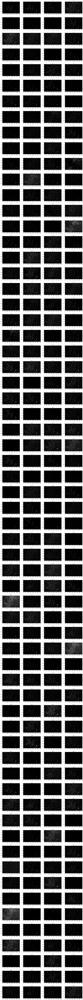

In [8]:
columns = 4
rows = math.ceil(out_resized_imgs.shape[2] / columns)
fig = plt.figure(figsize=(20, 4*rows))

# ax enables access to manipulate each of subplots
ax = []

for i in range(out_resized_imgs.shape[2]):
#     x = img_as_float(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY))
    y = img_as_float(out_resized_imgs[:,:,i])
#     out_ssim = ssim(x, y, data_range=y.max() - y.min())
#     out_psnr = psnr(x, y, data_range=y.max() - y.min())
#     out_mse  = mse(x, y)
    
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
#     ax[-1].set_title("SSIM = {:.2f}, PSNR = {:.2f}, MSE = {:.2f}".format(out_ssim, out_psnr, out_mse))
    ax[-1].set_title(i)
    plt.imshow(y, cmap='gray')

plt.show()  # finally, render the plot

### Apply Template Matching

**NOTE:** Other methods for TM:
- [ ] CV_TM_SQDIFF          (accept a mask template)
- [ ] CV_TM_SQDIFF_NORMED
- [ ] CV_TM_CCORR
- [ ] CV_TM_CCORR_NORMED    (accept a mask template)
- [ ] CV_TM_CCOEFF
- [x] CV_TM_CCOEFF_NORMED

Return a map between [-1, 1]
* -1: max anti-correlation
*  0: not correlated
*  1: max correlation

**Important**
> The resulting map must be single-channel 32-bit floating-point and if image is $W \times H$ and template image is $w \times h$, then result is $(W−w+1) \times (H−h+1)$.

**See:**

https://vovkos.github.io/doxyrest-showcase/opencv/sphinx_rtd_theme/page_tutorial_template_matching.html

### Analyze output

Corresponding average cell size for each video:

| Video | Avg_size | Radius |        Template       |
|-------|----------|--------|-----------------------|
| B1    | 7        | 3.5    | [312, 159, 323, 172]  |
| B2    | 7        | 3.5    | [113, 178, 122, 187]  |
| C1    | 25       | 12.5   | [251, 120, 308, 181]  |
| C2    | 5        | 2.5    | [994, 578, 1009, 595] |
| SC    | 5        | 2.5    | [219, 178, 230, 193]  |
| ME    | 11       | 5.5    | [245, 216, 268, 237]  |

In [9]:
# Readings
img_path = 'data/brain_2__1.jpg'
img = cv2.imread(img_path)
mask_img = cv2.imread("data/brain_2_mask.png", 0)
gt_path = 'data/brain_2_gt.txt'
gt = pd.read_csv(gt_path, sep="\t", header=None, names=["frame", "x", "y"])

# Specify parameters
threshold = 0.9
radius = 3.5

# Get ROI image as a template
#      x0  y0  x1  y1
r = [113, 178, 122, 187]

# Empty measures array
v_P = np.array([])
v_R = np.array([])
v_F = np.array([])
all_det = []

# Apply TM on all the feature images
for i in range(out_resized_imgs.shape[2]):

#     import timeit
#     start = timeit.timeit()
#     print('Processing frame', i)

    feature_img = cv2.normalize(src=out_resized_imgs[:,:,i],
                                dst=None, 
                                alpha=0, 
                                beta=255, 
                                norm_type=cv2.NORM_MINMAX, 
                                dtype=cv2.CV_8U)

    # Create template image
    tmp = feature_img[r[1]:r[3], r[0]:r[2]] # [y0:y1, x0:x1]
        
    # Apply template matching
    tm_map = cv2.matchTemplate(feature_img, tmp, cv2.TM_CCOEFF_NORMED)
    
    # Adjust resulting map by adding borders
    w, h = tmp.shape[::-1]
    left_right_border = int((w-1)/2)
    top_down_border = int((h-1)/2)
    tm_map = cv2.copyMakeBorder(src=tm_map,
                                top=top_down_border,
                                bottom=top_down_border,
                                left=left_right_border,
                                right=left_right_border,
                                borderType=cv2.BORDER_CONSTANT,
                                value=0)
    
    # Apply thresholding to resulting map
    binary = cv2.threshold(tm_map, threshold, 255, cv2.THRESH_BINARY)[1].astype(np.uint8)
    
    # Apply mask to the resulting map image
    binary = cv2.bitwise_and(binary, binary, mask=mask_img)
    
    # Get points from each binary object in the resulting image
    cnts = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    
    # Array of detections
    det = []
    
    # Loop over the contours
    for c in cnts:
        # Compute the center of the contour
        M = cv2.moments(c)
        if M["m00"] > 0.0:
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
        else:
            cX = c[0][0][0]
            cY = c[0][0][1]
        
        # Add centroid value in det array
        dict_cnt = {'frame': 1, 'x': cX, 'y': cY}
        det.append(dict_cnt)
    
    all_det.append(det)
    
#     # Store the coordinates of matched area in a numpy array 
#     det = np.where(tm_map >= threshold)
    
    # Get resulting measures
    df_gt = gt[gt['frame'] == 1]
    df_det = pd.DataFrame(det)
    P, R, F = get_measures_map(df_gt, df_det, radius)
    try:
        v_P = np.append(v_P, P)
        v_R = np.append(v_R, R)
        v_F = np.append(v_F, F)
    except:
        v_P = P
        v_R = R
        v_F = F
        
#     end = timeit.timeit()
#     print(end - start)
#     break
    
# print(v_P, v_R, v_F)
# print(binary.dtype)
# print(binary[150][279])
# plt.matshow(binary, cmap='gray')
# print(det)
# all_det

Number of GOOD image features: 8


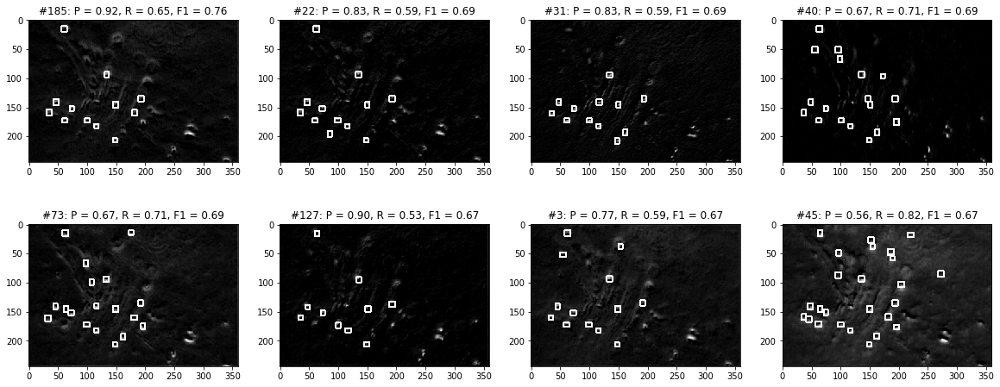

In [10]:
# # Get indexes greater than threshold
# v_F_thres = np.where(v_F >= 0.5)[0]

# Get indexes according to the retained measure value
retained_value = 0.1
stand_v_F = v_F / (np.sum(v_F) + np.finfo(float).eps)
idx_sorted = np.argsort(stand_v_F)[::-1]
cum_sorted_v_F = np.cumsum(stand_v_F[idx_sorted])
selected_v_F = idx_sorted[np.where(cum_sorted_v_F <= retained_value)]

# Add a threshold for v_F
sub = np.where(v_F[selected_v_F] > 0.1)[0]
sub_v_F = selected_v_F[sub]

columns = 4
rows = math.ceil(len(sub_v_F) / columns)
fig = plt.figure(figsize=(20, 4*rows))

print("Number of GOOD image features:", len(sub_v_F))

# ax enables access to manipulate each of subplots
ax = []

for i in range(len(sub_v_F)):
    # Image index (feature)
    j = sub_v_F[i]
    
    # Image to draw
    view_img = cv2.normalize(src=out_resized_imgs[:,:,j].copy(),
                                dst=None, 
                                alpha=0, 
                                beta=255, 
                                norm_type=cv2.NORM_MINMAX, 
                                dtype=cv2.CV_8U)
    
    # Draw a rectangle around the matched region. 
    for pt in all_det[j]:
        top_left = ( int(round(pt['x']-(w/2))), int(round(pt['y']-(h/2))))
        bottom_right = ( int(round(pt['x']+(w/2))), int(round(pt['y']+(h/2))))
        cv2.rectangle(view_img, top_left, bottom_right, (255,255,255), 2)
    
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
    ax[-1].set_title("#{}: P = {:.2f}, R = {:.2f}, F1 = {:.2f}".format(j, v_P[j], v_R[j], v_F[j]))
    plt.imshow(view_img, cmap='gray')

plt.show()  # finally, render the plot

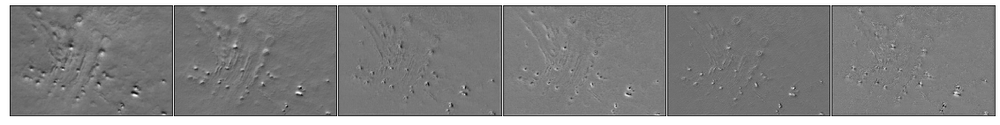

In [11]:
# Apply PCA
# -------------------------------------------
from sklearn.decomposition import PCA

rows = out_resized_imgs[:, :, sub_v_F].shape[0]
cols = out_resized_imgs[:, :, sub_v_F].shape[1]

data = formatImagesForPCA(out_resized_imgs[:, :, sub_v_F])
data_pca = PCA(n_components=0.98)
data_pca.fit(data)

n_comp = data_pca.components_.shape[0]

# Plot data
fig, axes = plt.subplots(1,n_comp,figsize=(20,5),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.01, wspace=0.01))

for i, ax in enumerate(axes.flat):
    ax.imshow(data_pca.components_[i].reshape(rows, cols),cmap="gray")